In [1]:
import uproot
import matplotlib.pyplot as plt
from scipy.interpolate import interp2d
import numpy as np
import healpy as hp
from tqdm import tqdm
import sys
# sys.path.append("/data/home/cwy/Science/3MLWCDA0.91/Standard/src/")
import ROOT as rt
import root_numpy as rn

Welcome to JupyROOT 6.24/06


In [16]:
import uproot
import matplotlib.pyplot as plt
from scipy.interpolate import interp2d
import numpy as np
import healpy as hp
from tqdm import tqdm
import sys
import ROOT as rt
import root_numpy as rn

file = uproot.open("/home/lhaaso/caowy/20210305_20230731_bkgJ2000.root")
header = file["Map_header"].arrays(library="np")
print(header)

nside=1024
npix=hp.nside2npix(nside)
dtype1 = [('count', float)]
dtype2 = [('count', float)]
skymaponout=np.zeros(npix) #, dtype = dtype1
skymapoffout=np.zeros(npix) #, dtype = dtype2
pixid = np.arange(npix)
pixarea= 4*np.pi/npix
new_lats = 90-hp.pix2ang(nside, pixid)[0]*180/np.pi # thetas I need to populate with interpolated theta values
new_lons = hp.pix2ang(nside, pixid)[1]*180/np.pi # phis, same

histogram_on = skymap = file[f"hon_{0}"]
ras = histogram_on.axis(0).centers()
decs = histogram_on.axis(1).centers()
# j=int(sys.argv[1])
j=100
with open("/home/lhaaso/caowy/LHAASO_skytrans/skytxt/WCDA_sky_on_off_part%i.txt"%(j),"a+") as fs:
    for bin in range(6):
        print('nHit%02d'%int(bin))
        skymap = file[f"hon_{bin}"].values().T
        skymapoff = file[f"hbkg_{bin}"].values().T
        fon = interp2d(ras,decs,skymap,kind='linear')
        fbkg = interp2d(ras,decs,skymapoff,kind='linear')
        for ipix in tqdm(pixid[j*12288:(j+1)*12288]):
            ra_pix , dec_pix = hp.pix2ang(1024,ipix,lonlat=True)
            if (dec_pix<-20.) | (dec_pix>80.):
                skymaponout[ipix]=hp.UNSEEN
                skymapoffout[ipix]=hp.UNSEEN
                continue
            skymaponout[ipix]=np.random.poisson(fon(ra_pix,dec_pix)/(np.radians(0.1)*np.radians(0.1)*np.cos(np.radians(dec_pix)))*pixarea)
            skymapoffout[ipix]=fbkg(ra_pix,dec_pix)/(np.radians(0.1)*np.radians(0.1)*np.cos(np.radians(dec_pix)))*pixarea
            fs.write(str(bin)+" "+str(0)+" "+str(ipix)+" "+str(skymaponout[ipix])+"\n")
            fs.write(str(bin)+" "+str(1)+" "+str(ipix)+" "+str(skymapoffout[ipix])+"\n")

{'fConfig': array(['/home/lhaaso/hushicong/8_All_sky_survey/script/DI_mask_v1.1.1_nbins_v2/src/config/DI_nhit_6bins_cygni_Mg_pinc_4hours_le2000.txt'],
      dtype=object), 'MJD0': array([59277.67261921]), 'MJD1': array([60156.66609676]), 'Ltime': array([68771059.])}
nHit00


/tmp/ipykernel_28086/2252782908.py:36: DeprecationWarning: `interp2d` is deprecated!
`interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://gist.github.com/ev-br/8544371b40f414b7eaf3fe6217209bff`

  fon = interp2d(ras,decs,skymap,kind='linear')
/tmp/ipykernel_28086/2252782908.py:37: DeprecationWarning: `interp2d` is deprecated!
`interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scatter

nHit01


100%|██████████| 12288/12288 [00:02<00:00, 4184.31it/s]


nHit02


100%|██████████| 12288/12288 [00:02<00:00, 4376.80it/s]


nHit03


100%|██████████| 12288/12288 [00:02<00:00, 4300.71it/s]


nHit04


100%|██████████| 12288/12288 [00:02<00:00, 4766.02it/s]


nHit05


100%|██████████| 12288/12288 [00:02<00:00, 4742.02it/s]


In [12]:
len(pixid[0:49152])

49152

In [13]:
12582912/1024

12288.0

In [ ]:
j=int(sys.argv[1])
for bin in range(6):
    print('nHit%02d'%int(bin))
    skymap = file[f"hon_{bin}"].values().T
    skymapoff = file[f"hbkg_{bin}"].values().T
    fon = interp2d(ras,decs,skymap,kind='linear')
    fbkg = interp2d(ras,decs,skymapoff,kind='linear')

    # for j in range(len(decs)):
    dec=decs[j]
    if (dec>=-25 and dec<=85):
        with open("/home/lhaaso/caowy/LHAASO_skytrans/skytxt/WCDA_sky_on_off_dec%i.txt"%(j),"a+") as fs:
            for i in tqdm(range(len(ras))):
                ra=ras[i]
                pick = (new_lons>ra-0.05) & (new_lons<ra+0.05) & (new_lats>dec-0.05) & (new_lats<dec+0.05)
                pixneed = pixid[pick]
                lens = np.sum(pick)
                if lens:
                    # poissonrand = np.random.poisson(skymap[j][i]/lens, lens)
                    for k in range(lens):
                        ra_pix , dec_pix = hp.pix2ang(1024,pixneed[k],lonlat=True)
                        con = np.random.poisson(fon(ra_pix,dec_pix)/(np.radians(0.1)*np.radians(0.1)*np.cos(np.radians(dec_pix)))*pixarea)
                        coff = fbkg(ra_pix,dec_pix)/(np.radians(0.1)*np.radians(0.1)*np.cos(np.radians(dec_pix)))*pixarea
                        fs.write(str(bin)+" "+str(0)+" "+str(pixneed[k])+" "+str(poissonrand[k])+"\n")
                        fs.write(str(bin)+" "+str(1)+" "+str(pixneed[k])+" "+str(coff[0])+"\n")

In [13]:
file = uproot.open("/home/lhaaso/caowy/20210305_20230731_bkgJ2000.root")
header = file["Map_header"].arrays(library="np")
print(header)

nside=1024
npix=hp.nside2npix(nside)
dtype1 = [('count', float)]
dtype2 = [('count', float)]
skymaponout=np.zeros(npix) #, dtype = dtype1
skymapoffout=np.zeros(npix) #, dtype = dtype2
pixid = np.arange(npix)
pixarea= 4*np.pi/npix
new_lats = 90-hp.pix2ang(nside, pixid)[0]*180/np.pi # thetas I need to populate with interpolated theta values
new_lons = hp.pix2ang(nside, pixid)[1]*180/np.pi # phis, same

histogram_on = skymap = file[f"hon_{0}"]
ras = histogram_on.axis(0).centers()
decs = histogram_on.axis(1).centers()

j=1000
for bin in range(6):
    print('nHit%02d'%int(bin))
    skymap = file[f"hon_{bin}"].values().T
    skymapoff = file[f"hbkg_{bin}"].values().T
    fbkg = interp2d(ras,decs,skymapoff,kind='linear')
    # for j in range(len(decs)):
    dec=decs[j]
    print(dec)
    if (dec>=-25 and dec<=85):
        with open("/home/lhaaso/caowy/LHAASO_skytrans/skytxt/WCDA_sky_on_off_dec%i.txt"%(j),"a+") as fs:
            for i in tqdm(range(len(ras))):
                ra=ras[i]
                pick = (new_lons>ra-0.05) & (new_lons<ra+0.05) & (new_lats>dec-0.05) & (new_lats<dec+0.05)
                pixneed = pixid[pick]
                lens = np.sum(pick)
                if lens:
                    poissonrand = np.random.poisson(skymap[i][j]/lens, lens)
                    for k in range(lens):
                        ra_pix , dec_pix = hp.pix2ang(1024,pixneed[k],lonlat=True)
                        coff = fbkg(ra_pix,dec_pix)/(np.radians(0.1)*np.radians(0.1)*np.cos(np.radians(dec_pix)))*pixarea
                        fs.write(str(bin)+" "+str(0)+" "+str(pixneed[k])+" "+str(poissonrand[k])+"\n")
                        fs.write(str(bin)+" "+str(1)+" "+str(pixneed[k])+" "+str(coff[0])+"\n")

{'fConfig': array(['/home/lhaaso/hushicong/8_All_sky_survey/script/DI_mask_v1.1.1_nbins_v2/src/config/DI_nhit_6bins_cygni_Mg_pinc_4hours_le2000.txt'],
      dtype=object), 'MJD0': array([59277.67261921]), 'MJD1': array([60156.66609676]), 'Ltime': array([68771059.])}
nHit00


/tmp/ipykernel_22718/156668908.py:25: DeprecationWarning: `interp2d` is deprecated!
`interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://gist.github.com/ev-br/8544371b40f414b7eaf3fe6217209bff`

  fbkg = interp2d(ras,decs,skymapoff,kind='linear')


10.050000000000004


  0%|          | 0/3600 [00:00<?, ?it/s]/tmp/ipykernel_22718/156668908.py:40: DeprecationWarning:         `interp2d` is deprecated!
        `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

        For legacy code, nearly bug-for-bug compatible replacements are
        `RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
        scattered 2D data.

        In new code, for regular grids use `RegularGridInterpolator` instead.
        For scattered data, prefer `LinearNDInterpolator` or
        `CloughTocher2DInterpolator`.

        For more details see
        `https://gist.github.com/ev-br/8544371b40f414b7eaf3fe6217209bff`

  coff = fbkg(ra_pix,dec_pix)/(np.radians(0.1)*np.radians(0.1)*np.cos(np.radians(dec_pix)))*pixarea
  2%|▏         | 76/3600 [00:06<04:54, 11.96it/s]


KeyboardInterrupt: 

In [2]:
file = uproot.open("/home/lhaaso/caowy/20210305_20230731_bkgJ2000.root")
header = file["Map_header"].arrays(library="np")
for i in range(6):
    skymap = file[f"hon_{i}"].values().T
    skymapoff = file[f"hbkg_{i}"].values().T

In [13]:
file = uproot.open("/data/home/cwy/Science/20210305_20230731_bkgJ2000.root")
header = file["Map_header"].arrays(library="np")

fout = rt.TFile.Open(f"./test.root", 'recreate')
tree = rt.TTree("BinInfo", "BinInfo")
name = bytearray(1)
duration = np.array([0], dtype=np.float64)
totalDuration = np.array([0], dtype=np.float64)
startMJD = np.array([0], dtype=np.float64)
stopMJD = np.array([0], dtype=np.float64)

# 将变量与branch关联
tree.Branch("name", name, "name/s")
tree.Branch("duration", duration, "duration/D")
tree.Branch("totalDuration", totalDuration, "totalDuration/D")
tree.Branch("startMJD", startMJD, "startMJD/D")
tree.Branch("stopMJD", stopMJD, "stopMJD/D")


nside=1024
npix=hp.nside2npix(nside)
dtype1 = [('count', float)]
dtype2 = [('count', float)]
skymaponout=np.zeros(npix, dtype = dtype1)
skymapoffout=np.zeros(npix, dtype = dtype2)
pixid = np.arange(npix)
pixarea= 4*np.pi/npix
# 填充数据

for i in range(6):
    name[0]=i
    duration[0] = 10
    totalDuration[0] = header['Ltime'][0]/60/60 #*0.99726956
    startMJD[0]=header['MJD0'][0]
    stopMJD[0]=header['MJD1'][0]
    tree.Fill()
fout.Write()
fout.Close()


for i in range(6):
    fout = rt.TFile.Open(f"./test.root", 'UPDATE')
    skymap = file[f"hon_{i}"].values().T
    skymapoff = file[f"hbkg_{i}"].values().T
    ra = file[f"hon_{i}"].axis(0).centers()
    dec = file[f"hon_{i}"].axis(1).centers()
    # RA, DEC=np.meshgrid(ra,dec)
    # plt.imshow(skymap, origin="lower", extent=[0,360,-90,90], aspect=True)
    fon = interp2d(ra,dec,skymap,kind='linear')
    fbkg = interp2d(ra,dec,skymapoff,kind='linear')
    
    ndir=fout.mkdir('nHit%02d'%int(i),'nHit%02d'%int(i))

    tree1=rt.TTree('data','data')
    tree2=rt.TTree('bkg','bkg')
    obj1 = rt.TParameter(int)("Nside",1024)
    obj2 = rt.TParameter(int)("Scheme",0)

    tree1.SetDirectory(ndir)
    tree1.SetEntries(npix)
    tree2.SetDirectory(ndir)
    tree2.SetEntries(npix)

    tree1.GetUserInfo().Add(obj1)
    tree1.GetUserInfo().Add(obj2)
    tree2.GetUserInfo().Add(obj1)
    tree2.GetUserInfo().Add(obj2)

    for ipix in tqdm(pixid):
        ra_pix , dec_pix = hp.pix2ang(1024,ipix,lonlat=True)
        if (dec_pix<-20.) | (dec_pix>80.):
            skymaponout[ipix]=hp.UNSEEN
            skymapoffout[ipix]=hp.UNSEEN
            continue
        skymaponout[ipix]=fon(ra_pix,dec_pix)/(np.radians(0.1)*np.radians(0.1)*np.cos(np.radians(dec_pix)))*pixarea
        skymapoffout[ipix]=fbkg(ra_pix,dec_pix)/(np.radians(0.1)*np.radians(0.1)*np.cos(np.radians(dec_pix)))*pixarea
    rn.array2tree(skymaponout,tree=tree1)
    rn.array2tree(skymapoffout,tree=tree2)
    fout.Write()
    fout.Close()


WARNING DeprecationWarning: `interp2d` is deprecated!
`interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://gist.github.com/ev-br/8544371b40f414b7eaf3fe6217209bff`



WARNING DeprecationWarning: `interp2d` is deprecated!
`interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://gist

0 360 -20 80


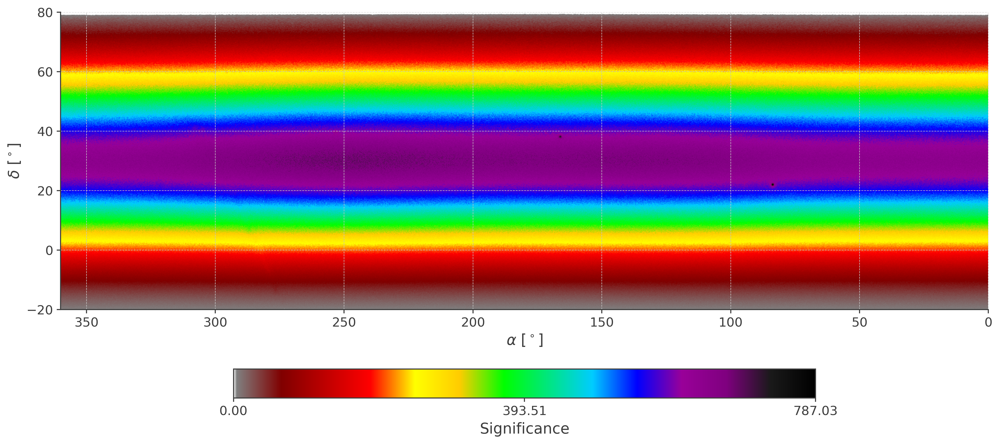

In [119]:
import mylib as my
skymaponout=hp.ma(skymaponout)
my.hpDraw("region_name", "Modelname", skymaponout,0,0,skyrange=(0,360,-20,80),
            colorlabel="Significance", contours=[10000000], save=False, cat={}, color="Milagro", xsize=2048)

0 360 -20 80


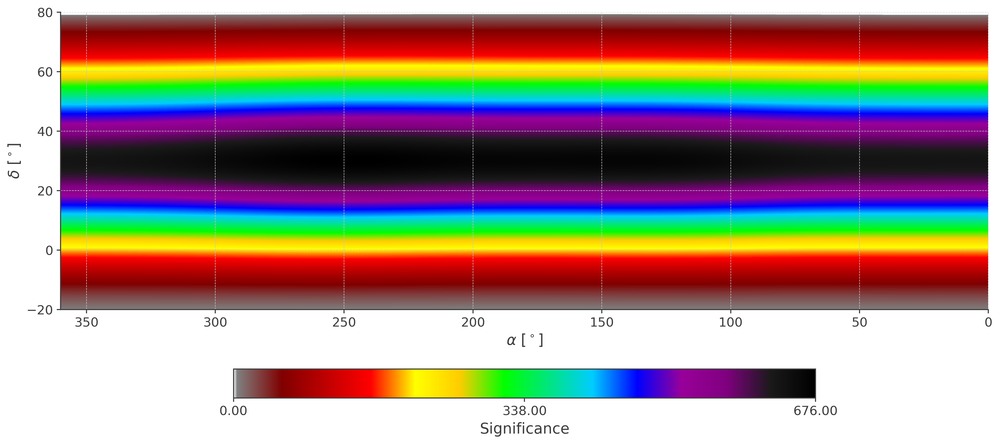

In [120]:
skymapoffout=hp.ma(skymapoffout)
my.hpDraw("region_name", "Modelname", skymapoffout,0,0,skyrange=(0,360,-20,80),
            colorlabel="Significance", contours=[10000000], save=False, cat={}, color="Milagro", xsize=2048)

0 360 -20 80


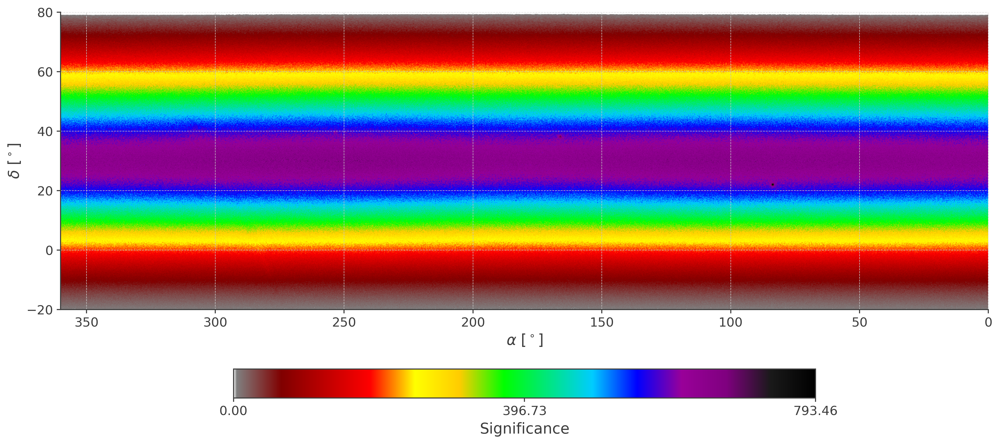

In [85]:
map2, skymapHeader = hp.read_map("/data/home/cwy/Science/3MLWCDA0.91/data/20210305_20230731_ihep_goodlist_nHit000_0.41.fits.gz",h=True)
map2=hp.ma(map2)
my.hpDraw("region_name", "Modelname", map2,0,0,skyrange=(0,360,-20,80),
            colorlabel="Significance", contours=[10000000], save=False, cat={}, color="Milagro", xsize=2048)

0 360 -20 80


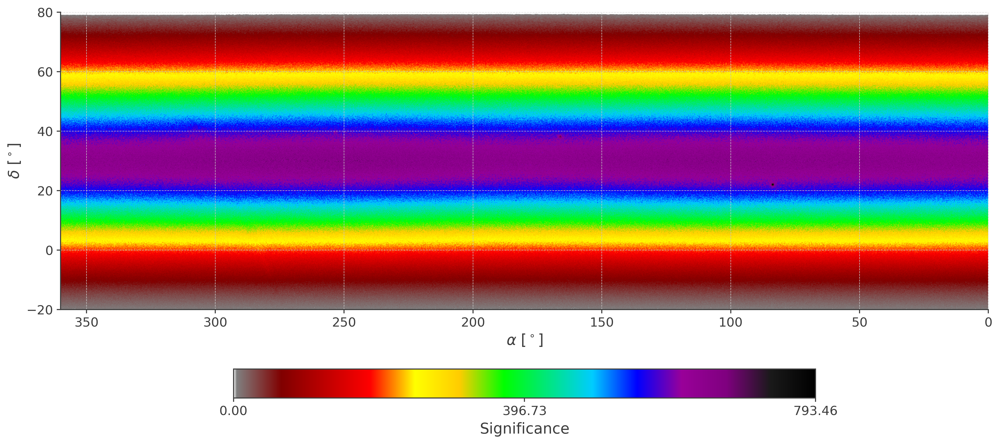

In [123]:
map2, skymapHeader = hp.read_map("/data/home/cwy/Science/3MLWCDA0.91/data/20210305_20230731_ihep_goodlist_nHit000_0.41.fits.gz",h=True, field=0)
map2=hp.ma(map2)
my.hpDraw("region_name", "Modelname", map2,0,0,skyrange=(0,360,-20,80),
            colorlabel="Significance", contours=[10000000], save=False, cat={}, color="Milagro", xsize=2048)

In [16]:
import array
import ctypes
file_chnage = rt.TFile.Open(f"/data/home/cwy/Science/3MLWCDA0.91/data/20210305-20230731_trans_fromhsc.root", 'UPDATE')
tree = file_chnage.Get("BinInfo")

newtree = tree.CloneTree(0)
# name = array.array('d', [0])
# name = rt.TString()
# name = rt.std.string()
duration = array.array('d', [0])
totalDuration = array.array('d', [0])
# name = array.array('b', [0])
name = bytearray(1)
19103.1
newtree.SetBranchAddress("duration", duration)
newtree.SetBranchAddress("name", name)
newtree.SetBranchAddress("totalDuration", totalDuration)
# b = newtree.GetBranch("name")
# newtree.GetListOfBranches().Remove(b)
# newtree.Branch("name", name, 'name/C')  #rt.AddressOf(

for i in tqdm(range(6)):
    tree.GetEntry(i)
    newtree.GetEntry(i)
    print(i, name[0])
    duration[0] = 10
    totalDuration[0]=header['Ltime'][0]/60/60
    # name.assign(str(i))
    name[0]=i
    # name.SetString(str(i))
    newtree.Fill()
print("!")
file_chnage.Write("", rt.TObject.kOverwrite)
file_chnage.Close()

100%|██████████| 6/6 [00:00<00:00, 9467.95it/s]

0 0
1 0
2 1
3 2
4 3
5 4
!
